In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.preprocessing import StandardScaler, RobustScaler

In [2]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
from IPython.display import Image

import seaborn as sns
import matplotlib.pylab as plt
sns.set_theme(style='whitegrid', font_scale=1.5)
plt.rc('font', family='malgun gothic')
plt.rc('axes', unicode_minus=False)
import scipy.stats as st
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [3]:
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import OLSInfluence

In [4]:
data = pd.read_csv('data/2022.csv', encoding='CP949')
data.rename(columns={ '가구주_성별코드':'성별', '가구주_교육정도_학력코드':'학력', '가구주_직업대분류코드':'직업', '가구주_만연령':'연령',
       '자산_금융자산_저축금액':'저축', '자산_실물자산_부동산금액':'부동산', '부채_금융부채_담보대출금액':'담보대출', '부채_금융부채_신용대출금액':'신용대출',
       '경상소득(보완)':'소득', '지출_소비지출_식료품(외식비포함)':'식료지출', '지출_소비지출_주거비':'주거지출', '지출_소비지출_교육비(보육료포함)':'교육지출',
       '지출_비소비지출_세금(보완)':'세금'},inplace=True)
data['학력'] = data['학력'].astype('category')
data['직업'].fillna('기타',inplace=True)

In [10]:
#int_columns = [ '저축', '부동산', '담보대출', '신용대출', '소득', '식료지출', '주거지출', '교육지출', '세금']
int_columns1 = [ '성별','가구원수','연령','저축', '부동산', '담보대출', '신용대출', '소득', '식료지출', '주거지출', '교육지출', '세금']

int_columns2 = ['저축', '부동산', '담보대출', '신용대출', '소득', '식료지출', '주거지출', '교육지출', '세금']
data_log1=data.copy()
data_log2=data.copy()
data_log1[int_columns] = np.log1p(data_log1[int_columns])
data_log2[int_columns] = np.log1p(data_log2[int_columns])

In [7]:
scaler = StandardScaler()
data[int_columns] = scaler.fit_transform(data[int_columns])

In [8]:
data.describe()

,성별,가구원수,연령,저축,부동산,담보대출,신용대출,소득,식료지출,주거지출,교육지출,세금
count,17954.000000,1.795400e+04,1.795400e+04,1.795400e+04,1.795400e+04,1.795400e+04,1.795400e+04,1.795400e+04,1.795400e+04,1.795400e+04,1.795400e+04,1.795400e+04
mean,1.279882,-3.032436e-14,-9.265545e-16,2.208549e-16,-1.779242e-15,-3.259965e-15,-3.290648e-15,-1.545680e-16,-2.744503e-15,-1.364491e-15,-9.204432e-15,1.494565e-15
std,0.448954,1.000028e+00,1.000028e+00,1.000028e+00,1.000028e+00,1.000028e+00,1.000028e+00,1.000028e+00,1.000028e+00,1.000028e+00,1.000028e+00,1.000028e+00
min,1.000000,-1.120841e+00,-2.661444e+00,-4.286996e-01,-5.381431e-01,-3.259019e-01,-2.525778e-01,-9.787911e-01,-1.432145e+00,-1.149127e+00,-4.071464e-01,-2.564922e-01
25%,1.000000,-1.120841e+00,-7.539532e-01,-3.902349e-01,-5.381431e-01,-3.259019e-01,-2.525778e-01,-6.188367e-01,-7.421153e-01,-5.169610e-01,-4.071464e-01,-2.440511e-01
50%,1.000000,-2.998056e-01,3.535335e-02,-2.523211e-01,-3.087634e-01,-3.259019e-01,-2.525778e-01,-2.525249e-01,-2.245930e-01,-2.359985e-01,-4.071464e-01,-2.059959e-01
75%,2.000000,5.212301e-01,7.588843e-01,3.669536e-02,1.069873e-01,-6.962648e-02,-2.525778e-01,3.101025e-01,6.379442e-01,2.258335e-01,-1.987851e-01,-7.865720e-02
max,2.000000,5.447445e+00,2.995253e+00,4.875332e+01,2.426353e+01,4.163166e+01,4.145560e+01,2.467736e+01,8.918302e+00,4.520968e+01,1.660902e+01,4.884573e+01


In [9]:
data_log.describe()

,성별,가구원수,연령,저축,부동산,담보대출,신용대출,소득,식료지출,주거지출,교육지출,세금
count,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000
mean,1.279882,1.149509,4.049258,7.704507,7.159920,2.889047,1.526676,8.286852,6.488232,5.564614,1.815199,4.122201
std,0.448954,0.357281,0.277179,1.988014,4.832362,4.213151,3.105628,0.909418,0.712547,0.680738,2.878741,1.989847
min,1.000000,0.693147,2.944439,0.000000,0.000000,0.000000,0.000000,3.258097,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.693147,3.871201,6.598167,0.000000,0.000000,0.000000,7.672874,5.993961,5.198497,0.000000,2.890372
50%,1.000000,1.098612,4.094345,8.119994,9.680406,0.000000,0.000000,8.368693,6.552508,5.564520,0.000000,4.248495
75%,2.000000,1.386294,4.262680,9.090064,10.714440,8.131825,0.000000,8.939679,7.090910,5.972534,4.795791,5.497168
max,2.000000,2.302585,4.653960,13.750349,14.363633,13.229694,11.827744,11.927436,8.699681,9.488048,9.190240,11.113880


In [65]:
data.shape

(17954, 15)

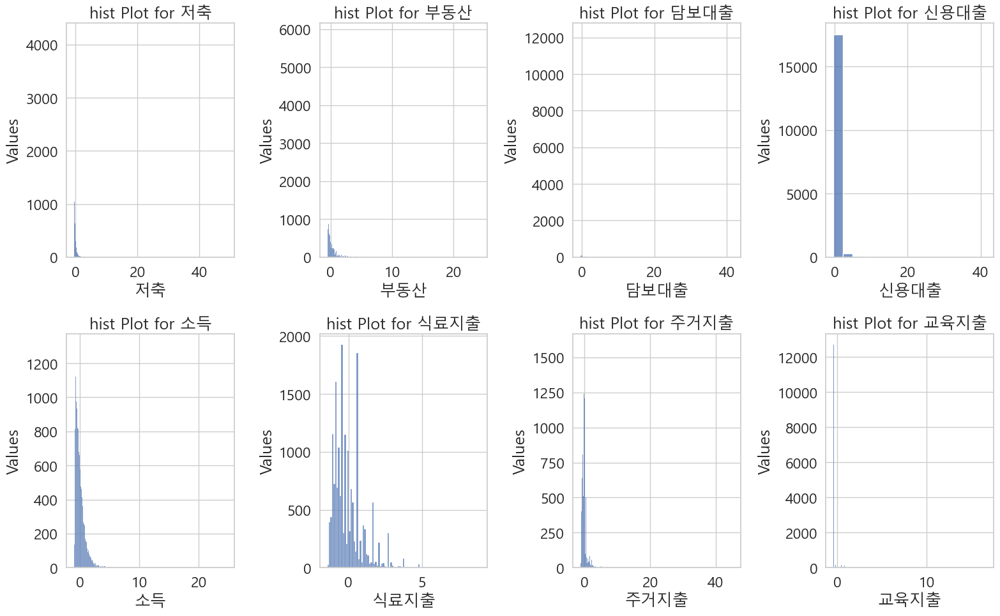

In [45]:
a = data['저축']
b = data['부동산']
c = data['담보대출']
d = data['신용대출']
e = data['소득']
f = data['식료지출']
g = data['주거지출']
h = data['교육지출']
i = data['세금']
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 10))
variables = ['저축','부동산','담보대출','신용대출','소득', '식료지출', '주거지출', '교육지출', '세금']
data_list = [a,b, c, d, e, f, g, h, i]

for ax, variable, values in zip(axes.flatten(), variables, data_list):
    sns.histplot(x=values, ax=ax,legend=True)
    ax.set_xlabel(variable)
    ax.set_ylabel('Values')
    ax.set_title(f'hist Plot for {variable}')

plt.tight_layout()
plt.savefig('data')

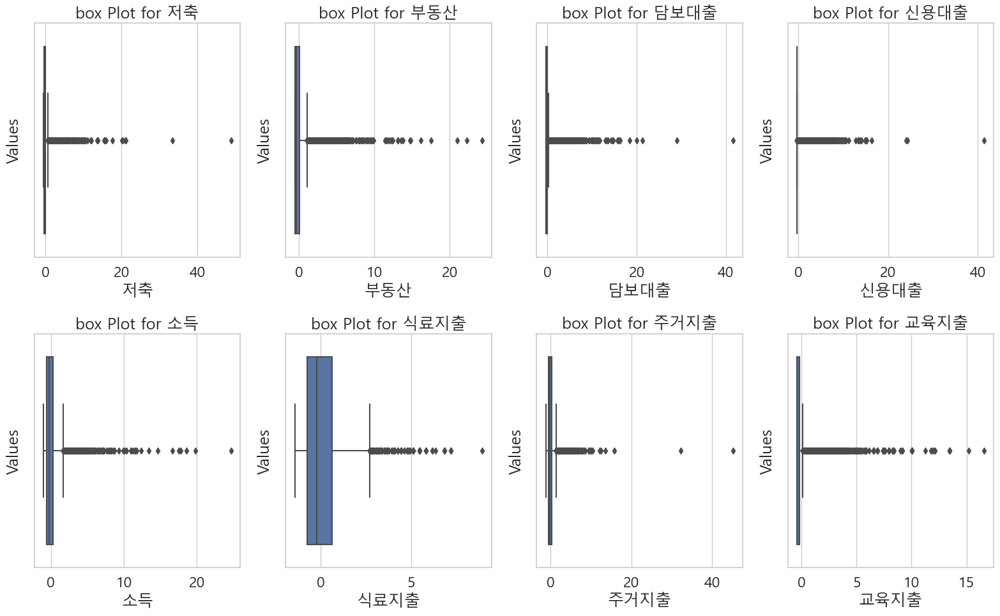

In [46]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 10))

for ax, variable, values in zip(axes.flatten(), variables, data_list):
    sns.boxplot(x=values, ax=ax)
    ax.set_xlabel(variable)
    ax.set_ylabel('Values')
    ax.set_title(f'box Plot for {variable}')

plt.tight_layout()
plt.savefig('data')

def remove_outliers_percentile(data, columns, lower_percentile=0.1, upper_percentile=0.9):
    for col in columns:
        lower_bound = data[col].quantile(lower_percentile)
        upper_bound = data[col].quantile(upper_percentile)
        data = data[(data[col] >= lower_bound) & (data[col] <= upper_bound)]
    return data
# 표준화된 데이터에 대해 이상치 제거
filtered_data = remove_outliers_iqr(data, int_columns)

In [17]:
def remove_outliers_iqr(data, columns):
    for col in columns:
        q1 = data[col].quantile(0.25)
        q3 = data[col].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        data = data[(data[col] >= lower_bound) & (data[col] <= upper_bound)]
    return data

# 표준화된 데이터에 대해 이상치 제거
filtered_data = remove_outliers_iqr(data, int_columns)
filtered_data_log1 = remove_outliers_iqr(data_log1, int_columns1)
filtered_data_log2 = remove_outliers_iqr(data_log2, int_columns2)

In [14]:
def remove_outliers_percentile(data, columns, lower_percentile=0.1, upper_percentile=0.9):
    for col in columns:
        lower_bound = data[col].quantile(lower_percentile)
        upper_bound = data[col].quantile(upper_percentile)
        data = data[(data[col] >= lower_bound) & (data[col] <= upper_bound)]
    return data
# 표준화된 데이터에 대해 이상치 제거
filtered_data10 = remove_outliers_percentile(data, int_columns)
filtered_data10_log1 = remove_outliers_percentile(data_log1, int_columns1)
filtered_data10_log2 = remove_outliers_percentile(data_log2, int_columns2)

In [81]:
filtered_data10.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3237 entries, 1 to 17916
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   수도권여부   3237 non-null   object  
 1   성별      3237 non-null   int64   
 2   가구원수    3237 non-null   float64 
 3   학력      3237 non-null   category
 4   직업      3237 non-null   object  
 5   연령      3237 non-null   float64 
 6   저축      3237 non-null   float64 
 7   부동산     3237 non-null   float64 
 8   담보대출    3237 non-null   float64 
 9   신용대출    3237 non-null   float64 
 10  소득      3237 non-null   float64 
 11  식료지출    3237 non-null   float64 
 12  주거지출    3237 non-null   float64 
 13  교육지출    3237 non-null   float64 
 14  세금      3237 non-null   float64 
dtypes: category(1), float64(11), int64(1), object(2)
memory usage: 382.9+ KB


In [15]:
def remove_outliers_percentile(data, columns, lower_percentile=0.05, upper_percentile=0.95):
    for col in columns:
        lower_bound = data[col].quantile(lower_percentile)
        upper_bound = data[col].quantile(upper_percentile)
        data = data[(data[col] >= lower_bound) & (data[col] <= upper_bound)]
    return data
# 표준화된 데이터에 대해 이상치 제거
filtered_data5 = remove_outliers_percentile(data, int_columns)
filtered_data5_log1 = remove_outliers_percentile(data_log1, int_columns1)
filtered_data5_log2 = remove_outliers_percentile(data_log2, int_columns2)

In [83]:
filtered_data5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8223 entries, 1 to 17947
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   수도권여부   8223 non-null   object  
 1   성별      8223 non-null   int64   
 2   가구원수    8223 non-null   float64 
 3   학력      8223 non-null   category
 4   직업      8223 non-null   object  
 5   연령      8223 non-null   float64 
 6   저축      8223 non-null   float64 
 7   부동산     8223 non-null   float64 
 8   담보대출    8223 non-null   float64 
 9   신용대출    8223 non-null   float64 
 10  소득      8223 non-null   float64 
 11  식료지출    8223 non-null   float64 
 12  주거지출    8223 non-null   float64 
 13  교육지출    8223 non-null   float64 
 14  세금      8223 non-null   float64 
dtypes: category(1), float64(11), int64(1), object(2)
memory usage: 972.0+ KB


In [16]:
def remove_outliers_percentile(data, columns, lower_percentile=0.01, upper_percentile=0.99):
    for col in columns:
        lower_bound = data[col].quantile(lower_percentile)
        upper_bound = data[col].quantile(upper_percentile)
        data = data[(data[col] >= lower_bound) & (data[col] <= upper_bound)]
    return data
# 표준화된 데이터에 대해 이상치 제거
filtered_data1 = remove_outliers_percentile(data, int_columns)
filtered_data1_log1 = remove_outliers_percentile(data_log1, int_columns1)
filtered_data1_log2 = remove_outliers_percentile(data_log2, int_columns2)

In [85]:
filtered_data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15441 entries, 1 to 17947
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   수도권여부   15441 non-null  object  
 1   성별      15441 non-null  int64   
 2   가구원수    15441 non-null  float64 
 3   학력      15441 non-null  category
 4   직업      15441 non-null  object  
 5   연령      15441 non-null  float64 
 6   저축      15441 non-null  float64 
 7   부동산     15441 non-null  float64 
 8   담보대출    15441 non-null  float64 
 9   신용대출    15441 non-null  float64 
 10  소득      15441 non-null  float64 
 11  식료지출    15441 non-null  float64 
 12  주거지출    15441 non-null  float64 
 13  교육지출    15441 non-null  float64 
 14  세금      15441 non-null  float64 
dtypes: category(1), float64(11), int64(1), object(2)
memory usage: 1.8+ MB


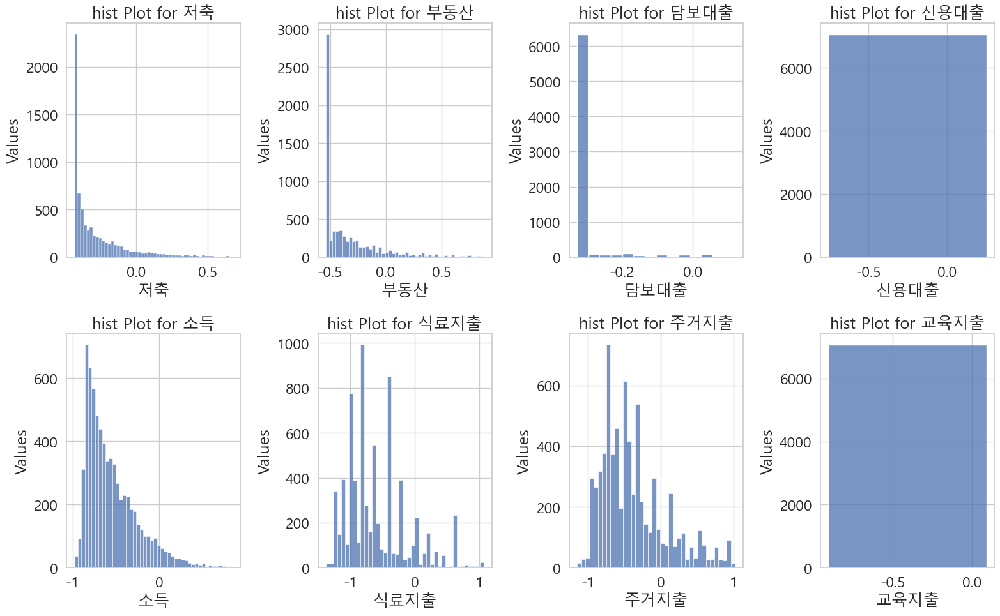

In [50]:
a = filtered_data['저축']
b = filtered_data['부동산']
c = filtered_data['담보대출']
d = filtered_data['신용대출']
e = filtered_data['소득']
f = filtered_data['식료지출']
g = filtered_data['주거지출']
h = filtered_data['교육지출']
i = filtered_data['세금']
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 10))
variables = ['저축','부동산','담보대출','신용대출','소득', '식료지출', '주거지출', '교육지출', '세금']
data_list = [a,b, c, d, e, f, g, h, i]

for ax, variable, values in zip(axes.flatten(), variables, data_list):
    sns.histplot(x=values, ax=ax,legend=True)
    ax.set_xlabel(variable)
    ax.set_ylabel('Values')
    ax.set_title(f'hist Plot for {variable}')

plt.tight_layout()
plt.savefig('filtered_data')

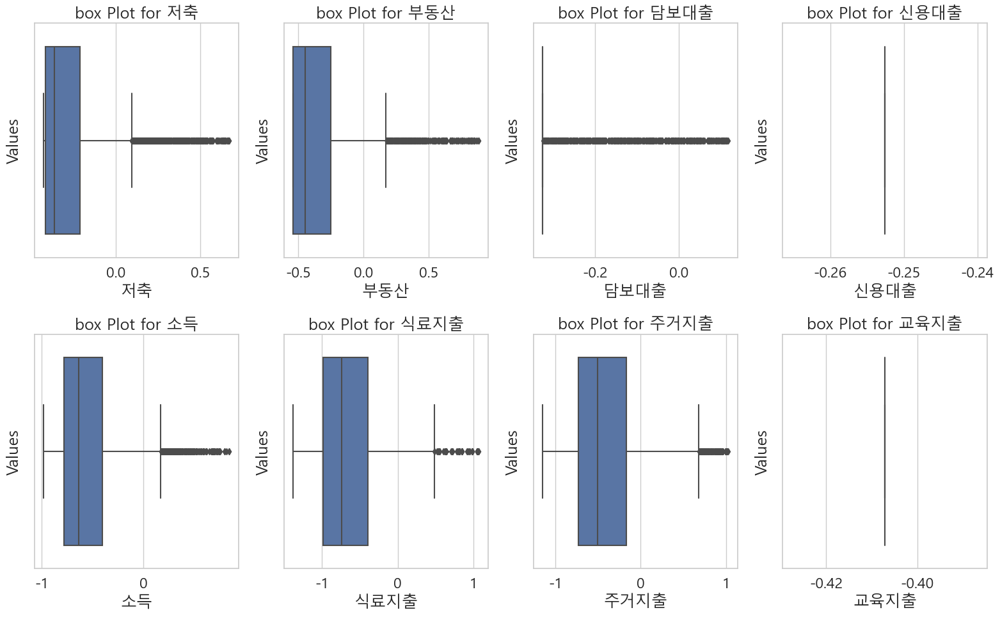

In [51]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 10))

for ax, variable, values in zip(axes.flatten(), variables, data_list):
    sns.boxplot(x=values, ax=ax)
    ax.set_xlabel(variable)
    ax.set_ylabel('Values')
    ax.set_title(f'box Plot for {variable}')

plt.tight_layout()
plt.savefig('filtered_data')

In [32]:
filtered_data.describe()

,성별,가구원수,연령,저축,부동산,담보대출,신용대출,소득,식료지출,주거지출,교육지출,세금
count,7063.000000,7063.000000,7063.000000,7063.000000,7063.000000,7063.000000,7.063000e+03,7063.000000,7063.000000,7063.000000,7.063000e+03,7063.000000
mean,1.434235,-0.638659,0.572696,-0.276338,-0.341156,-0.303805,-2.525778e-01,-0.553269,-0.598100,-0.381953,-4.071464e-01,-0.233365
std,0.495691,0.564973,0.949027,0.202574,0.270077,0.075019,2.792409e-14,0.295905,0.475219,0.446459,2.992263e-14,0.026356
min,1.000000,-1.120841,-2.661444,-0.428700,-0.538143,-0.325902,-2.525778e-01,-0.978791,-1.380393,-1.149127,-4.071464e-01,-0.256492
25%,1.000000,-1.120841,0.101129,-0.417728,-0.538143,-0.325902,-2.525778e-01,-0.781289,-0.983626,-0.727683,-4.071464e-01,-0.254297
50%,1.000000,-1.120841,0.693109,-0.364080,-0.444958,-0.325902,-2.525778e-01,-0.635154,-0.742115,-0.502913,-4.071464e-01,-0.243319
75%,2.000000,-0.299806,1.285089,-0.212793,-0.251418,-0.325902,-2.525778e-01,-0.399168,-0.397100,-0.165758,-4.071464e-01,-0.220998
max,2.000000,2.984337,2.995253,0.673666,0.881144,0.118811,-2.525778e-01,0.846029,1.069213,1.024821,-4.071464e-01,-0.143790


In [33]:
filtered_data.drop(columns={'신용대출','교육지출'},inplace=True)

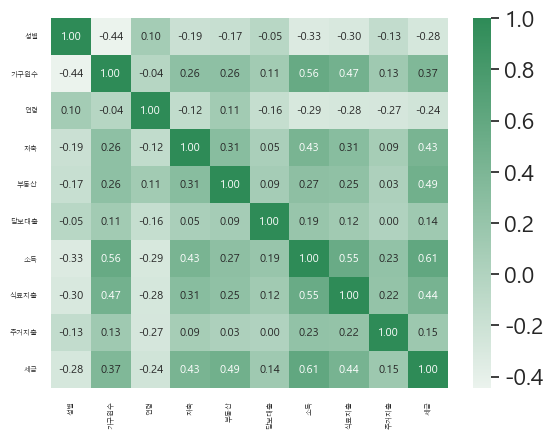

In [34]:
cmap = sns.light_palette("seagreen", as_cmap = True)  
heatmap = sns.heatmap(filtered_data.corr(), annot=True,annot_kws={'size': 8},fmt='.2f', cmap=cmap)
heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=5)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=5)
plt.savefig("filtered_data_linear")


<function matplotlib.pyplot.show(close=None, block=None)>

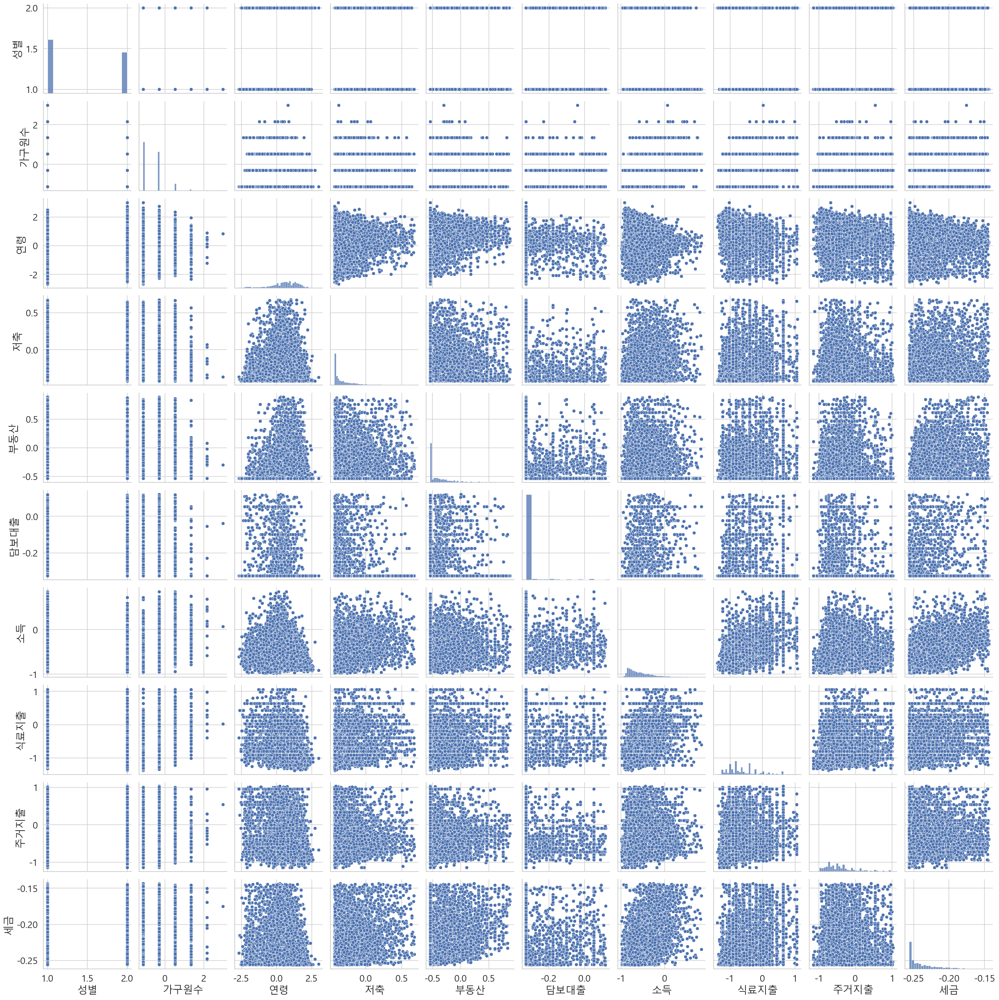

In [35]:
sns.pairplot(filtered_data)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

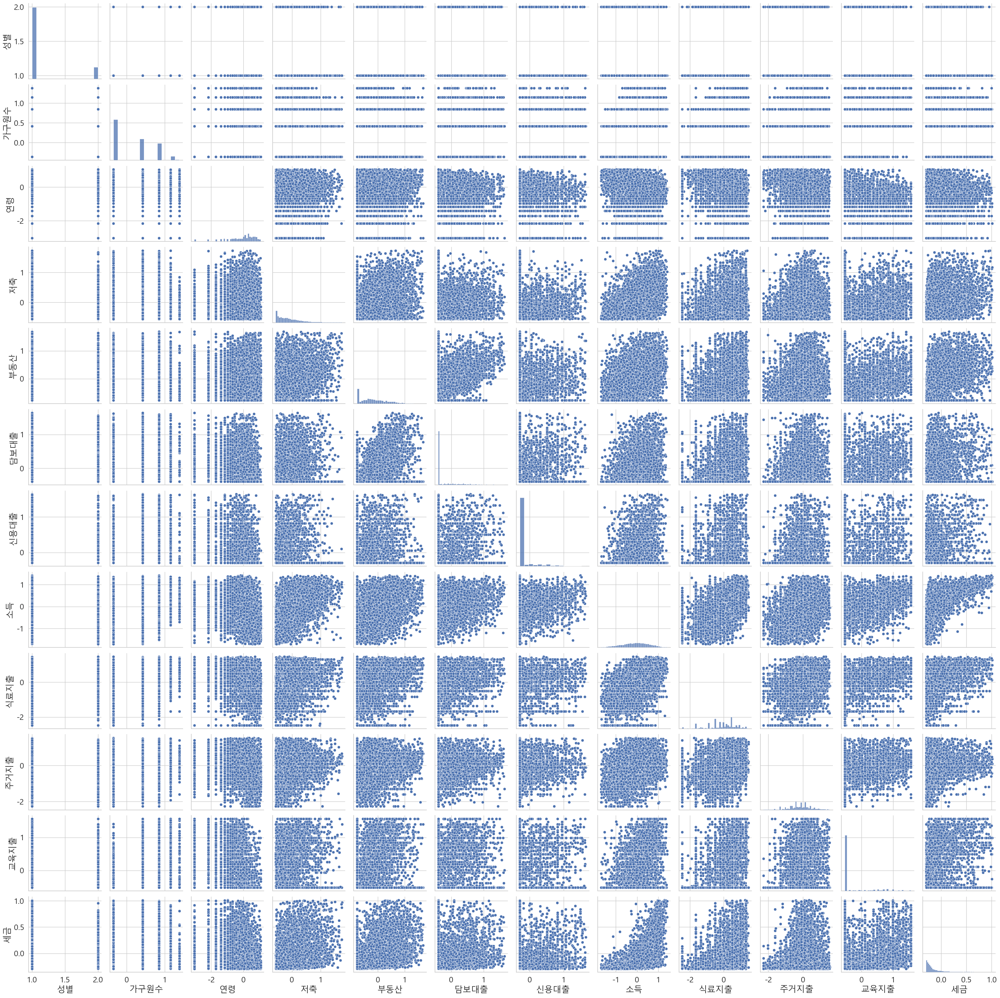

In [28]:
sns.pairplot(filtered_data1_log1)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

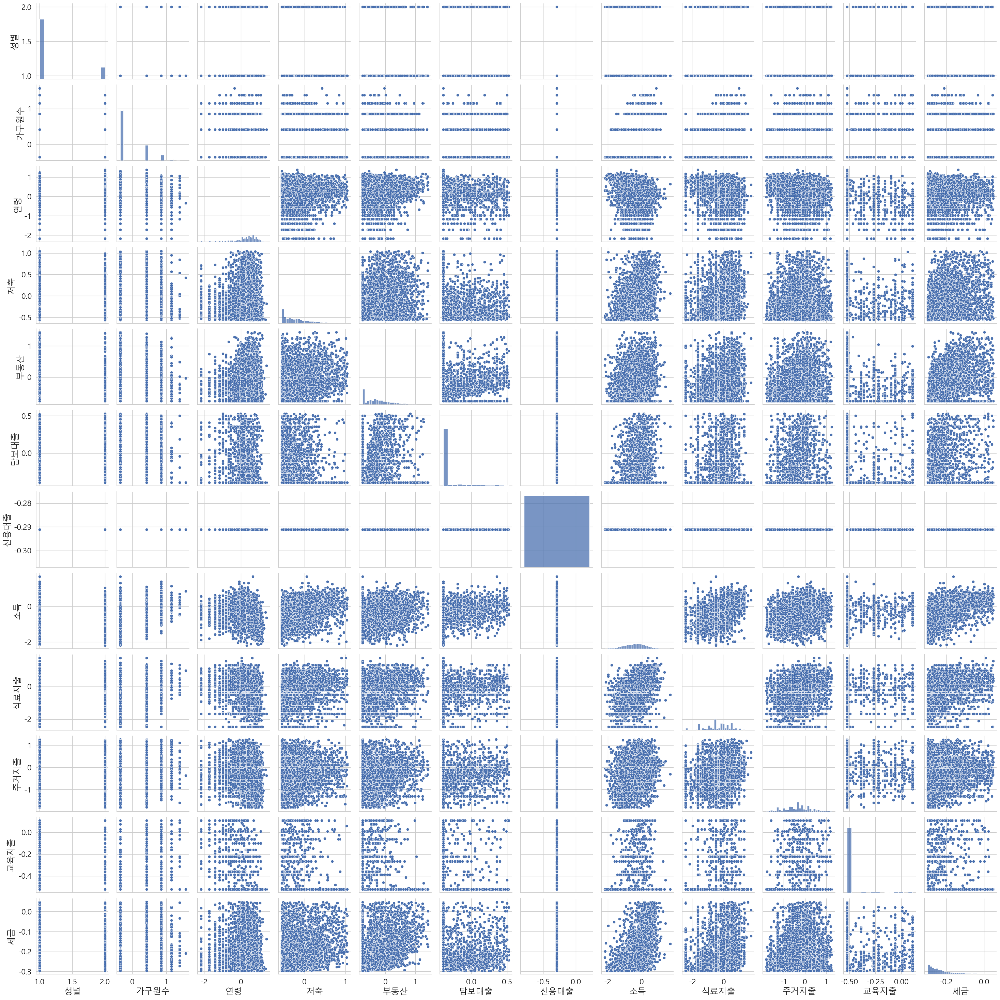

In [29]:
sns.pairplot(filtered_data_log1)
plt.show

In [88]:
model_iqr = smf.ols('소득 ~ 성별 + 가구원수 + 연령 + 저축 + 부동산 + 담보대출 + 식료지출 + 주거지출 + 세금 + 직업 + 수도권여부 + C(학력, Treatment(reference=6))', data = filtered_data).fit()
model_10 = smf.ols('소득 ~ 성별 + 가구원수 + 연령 + 저축 + 부동산 + 담보대출 + 식료지출 + 주거지출 + 세금 + 직업 + 수도권여부 + C(학력, Treatment(reference=6))', data = filtered_data10).fit()
model_5 = smf.ols('소득 ~ 성별 + 가구원수 + 연령 + 저축 + 부동산 + 담보대출 + 식료지출 + 주거지출 + 세금 + 직업 + 수도권여부 + C(학력, Treatment(reference=6))', data = filtered_data5).fit()
model_1 = smf.ols('소득 ~ 성별 + 가구원수 + 연령 + 저축 + 부동산 + 담보대출 + 식료지출 + 주거지출 + 세금 + 직업 + 수도권여부 + C(학력, Treatment(reference=6))', data = filtered_data1).fit()

In [18]:
model_iqr_log1 = smf.ols('소득 ~ 성별 + 가구원수 + 연령 + 저축 + 부동산 + 담보대출 + 식료지출 + 주거지출 + 세금 + 직업 + 수도권여부 + C(학력, Treatment(reference=6))', data = filtered_data_log1).fit()
model_10_log1 = smf.ols('소득 ~ 성별 + 가구원수 + 연령 + 저축 + 부동산 + 담보대출 + 식료지출 + 주거지출 + 세금 + 직업 + 수도권여부 + C(학력, Treatment(reference=6))', data = filtered_data10_log1).fit()
model_5_log1 = smf.ols('소득 ~ 성별 + 가구원수 + 연령 + 저축 + 부동산 + 담보대출 + 식료지출 + 주거지출 + 세금 + 직업 + 수도권여부 + C(학력, Treatment(reference=6))', data = filtered_data5_log1).fit()
model_1_log1 = smf.ols('소득 ~ 성별 + 가구원수 + 연령 + 저축 + 부동산 + 담보대출 + 식료지출 + 주거지출 + 세금 + 직업 + 수도권여부 + C(학력, Treatment(reference=6))', data = filtered_data1_log1).fit()

In [19]:
model_iqr_log2 = smf.ols('소득 ~ 성별 + 가구원수 + 연령 + 저축 + 부동산 + 담보대출 + 식료지출 + 주거지출 + 세금 + 직업 + 수도권여부 + C(학력, Treatment(reference=6))', data = filtered_data_log2).fit()
model_10_log2 = smf.ols('소득 ~ 성별 + 가구원수 + 연령 + 저축 + 부동산 + 담보대출 + 식료지출 + 주거지출 + 세금 + 직업 + 수도권여부 + C(학력, Treatment(reference=6))', data = filtered_data10_log2).fit()
model_5_log2 = smf.ols('소득 ~ 성별 + 가구원수 + 연령 + 저축 + 부동산 + 담보대출 + 식료지출 + 주거지출 + 세금 + 직업 + 수도권여부 + C(학력, Treatment(reference=6))', data = filtered_data5_log2).fit()
model_1_log2 = smf.ols('소득 ~ 성별 + 가구원수 + 연령 + 저축 + 부동산 + 담보대출 + 식료지출 + 주거지출 + 세금 + 직업 + 수도권여부 + C(학력, Treatment(reference=6))', data = filtered_data1_log2).fit()

In [89]:
model_iqr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     소득   R-squared:                       0.604
Model:                            OLS   Adj. R-squared:                  0.603
Method:                 Least Squares   F-statistic:                     413.0
Date:                Sat, 09 Dec 2023   Prob (F-statistic):               0.00
Time:                        17:27:54   Log-Likelihood:                 1852.1
No. Observations:                7063   AIC:                            -3650.
Df Residuals:                    7036   BIC:                            -3465.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.6352      0.067      9.468      0.000       0.504       0.767
직업[T.2]                               -0.0439      0.064     -0.689      0.491      -0.169       0.081
직업[T.3]                               -0.0613      0.064     -0.960      0.337      -0.187       0.064
직업[T.4]                               -0.0320      0.063     -0.505      0.614      -0.156       0.092
직업[T.5]                               -0.0418      0.064     -0.654      0.513      -0.167       0.083
직업[T.6]                               -0.0208      0.063     -0.329      0.742      -0.144       0.103
직업[T.7]                               -0.0089      0.063     -0.140      0.889      -0.133       0.115
직업[T.8]                                0.0103      0.063      0.163      0.871      -0.114       0.134
직업[T.9]                               -0.0545      0.063     -0.866      0.387      -0.178       0.069
직업[T.기타]                              -0.1359      0.063     -2.165      0.030      -0.259      -0.013
수도권여부[T.G2]                            0.0085      0.005      1.594      0.111      -0.002       0.019
C(학력, Treatment(reference=6))[T.1]    -0.0088      0.012     -0.744      0.457      -0.032       0.014
C(학력, Treatment(reference=6))[T.2]    -0.0062      0.010     -0.627      0.531      -0.026       0.013
C(학력, Treatment(reference=6))[T.3]     0.0025      0.010      0.252      0.801      -0.017       0.022
C(학력, Treatment(reference=6))[T.4]     0.0016      0.009      0.175      0.861      -0.016       0.019
C(학력, Treatment(reference=6))[T.5]     0.0081      0.012      0.671      0.502      -0.016       0.032
C(학력, Treatment(reference=6))[T.7]     0.0347      0.023      1.508      0.132      -0.010       0.080
C(학력, Treatment(reference=6))[T.8]     0.1228      0.049      2.498      0.013       0.026       0.219
성별                                     0.0083      0.006      1.506      0.132      -0.002       0.019
가구원수                                   0.1535      0.005     30.885      0.000       0.144       0.163
연령                                    -0.0107      0.003     -3.165      0.002      -0.017      -0.004
저축                                     0.1876      0.013     14.902      0.000       0.163       0.212
부동산                                   -0.0634      0.010     -6.165      0.000      -0.084      -0.043
담보대출                                   0.2301      0.031      7.542      0.000       0.170       0.290
식료지출                                   0.1049      0.006     17.455      0.000       0.093       0.117
주거지출                                   0.0423      0.005      7.980      0.000       0.032       0.053
세금                                     3.6113      0.115     31.355      0.000       3.386      

In [90]:
model_10.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     소득   R-squared:                       0.397
Model:                            OLS   Adj. R-squared:                  0.392
Method:                 Least Squares   F-statistic:                     81.33
Date:                Sat, 09 Dec 2023   Prob (F-statistic):               0.00
Time:                        17:28:05   Log-Likelihood:                 270.44
No. Observations:                3237   AIC:                            -486.9
Df Residuals:                    3210   BIC:                            -322.6
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.4410      0.066      6.690      0.000       0.312       0.570
직업[T.2]                                0.0099      0.061      0.162      0.871      -0.110       0.130
직업[T.3]                               -0.0063      0.061     -0.103      0.918      -0.126       0.113
직업[T.4]                                0.0040      0.060      0.066      0.947      -0.115       0.123
직업[T.5]                                0.0275      0.061      0.452      0.651      -0.092       0.147
직업[T.6]                                0.0353      0.060      0.588      0.557      -0.083       0.153
직업[T.7]                                0.0232      0.060      0.390      0.697      -0.094       0.140
직업[T.8]                                0.0597      0.059      1.007      0.314      -0.057       0.176
직업[T.9]                                0.0214      0.059      0.360      0.719      -0.095       0.138
직업[T.기타]                              -0.0647      0.059     -1.091      0.275      -0.181       0.052
수도권여부[T.G2]                           -0.0003      0.009     -0.034      0.973      -0.019       0.018
C(학력, Treatment(reference=6))[T.1]    -0.0346      0.030     -1.143      0.253      -0.094       0.025
C(학력, Treatment(reference=6))[T.2]    -0.0212      0.017     -1.240      0.215      -0.055       0.012
C(학력, Treatment(reference=6))[T.3]    -0.0057      0.016     -0.358      0.720      -0.037       0.026
C(학력, Treatment(reference=6))[T.4]     0.0053      0.014      0.391      0.696      -0.021       0.032
C(학력, Treatment(reference=6))[T.5]     0.0002      0.018      0.014      0.989      -0.035       0.035
C(학력, Treatment(reference=6))[T.7]    -0.0027      0.034     -0.081      0.935      -0.069       0.063
C(학력, Treatment(reference=6))[T.8]     0.1627      0.072      2.255      0.024       0.021       0.304
성별                                     0.0024      0.011      0.227      0.820      -0.018       0.023
가구원수                                   0.1227      0.007     17.931      0.000       0.109       0.136
연령                                     0.0164      0.008      2.063      0.039       0.001       0.032
저축                                     0.1642      0.019      8.833      0.000       0.128       0.201
부동산                                   -0.0739      0.016     -4.717      0.000      -0.105      -0.043
담보대출                                   0.1145      0.023      4.979      0.000       0.069       0.160
식료지출                                   0.0978      0.010      9.592      0.000       0.078       0.118
주거지출                                   0.0394      0.011      3.440      0.001       0.017       0.062
세금                                     3.1105      0.148     21.041      0.000       2.821      

In [91]:
model_5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     소득   R-squared:                       0.584
Model:                            OLS   Adj. R-squared:                  0.582
Method:                 Least Squares   F-statistic:                     425.8
Date:                Sat, 09 Dec 2023   Prob (F-statistic):               0.00
Time:                        17:28:09   Log-Likelihood:                -589.14
No. Observations:                8223   AIC:                             1234.
Df Residuals:                    8195   BIC:                             1431.
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.3013      0.033      9.140      0.000       0.237       0.366
직업[T.2]                               -0.0060      0.033     -0.184      0.854      -0.070       0.058
직업[T.3]                               -0.0014      0.033     -0.043      0.966      -0.065       0.063
직업[T.4]                                0.0155      0.033      0.469      0.639      -0.049       0.080
직업[T.5]                                0.0109      0.033      0.330      0.741      -0.054       0.076
직업[T.6]                                0.0452      0.033      1.371      0.171      -0.019       0.110
직업[T.7]                                0.0287      0.032      0.890      0.374      -0.035       0.092
직업[T.8]                                0.0568      0.032      1.776      0.076      -0.006       0.119
직업[T.9]                                0.0014      0.032      0.043      0.966      -0.061       0.064
직업[T.A]                                0.1354      0.154      0.880      0.379      -0.166       0.437
직업[T.기타]                              -0.1026      0.032     -3.217      0.001      -0.165      -0.040
수도권여부[T.G2]                           -0.0007      0.007     -0.113      0.910      -0.014       0.012
C(학력, Treatment(reference=6))[T.1]    -0.0468      0.020     -2.381      0.017      -0.085      -0.008
C(학력, Treatment(reference=6))[T.2]    -0.0231      0.012     -1.846      0.065      -0.048       0.001
C(학력, Treatment(reference=6))[T.3]     0.0149      0.012      1.277      0.202      -0.008       0.038
C(학력, Treatment(reference=6))[T.4]     0.0185      0.009      1.991      0.047       0.000       0.037
C(학력, Treatment(reference=6))[T.5]     0.0018      0.011      0.158      0.874      -0.021       0.024
C(학력, Treatment(reference=6))[T.7]     0.0558      0.021      2.695      0.007       0.015       0.096
C(학력, Treatment(reference=6))[T.8]     0.0717      0.040      1.799      0.072      -0.006       0.150
성별                                    -0.0126      0.008     -1.653      0.098      -0.027       0.002
가구원수                                   0.1231      0.004     29.089      0.000       0.115       0.131
연령                                     0.0143      0.005      2.795      0.005       0.004       0.024
저축                                     0.1882      0.011     17.289      0.000       0.167       0.210
부동산                                   -0.0462      0.009     -4.953      0.000      -0.065      -0.028
담보대출                                   0.1016      0.011      9.434      0.000       0.080       0.123
식료지출                                   0.1045      0.006     16.646      0.000       0.092       0.117
주거지출                                   0.0474      0.006      7.638      0.000       0.035      

In [92]:
model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     소득   R-squared:                       0.715
Model:                            OLS   Adj. R-squared:                  0.715
Method:                 Least Squares   F-statistic:                     1435.
Date:                Sat, 09 Dec 2023   Prob (F-statistic):               0.00
Time:                        17:28:13   Log-Likelihood:                -4703.8
No. Observations:               15441   AIC:                             9464.
Df Residuals:                   15413   BIC:                             9678.
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.1257      0.025      4.999      0.000       0.076       0.175
직업[T.2]                                0.0234      0.025      0.946      0.344      -0.025       0.072
직업[T.3]                                0.0323      0.025      1.314      0.189      -0.016       0.080
직업[T.4]                                0.0065      0.026      0.253      0.800      -0.044       0.056
직업[T.5]                                0.0060      0.025      0.236      0.814      -0.044       0.056
직업[T.6]                                0.0307      0.026      1.189      0.234      -0.020       0.081
직업[T.7]                                0.0370      0.025      1.481      0.139      -0.012       0.086
직업[T.8]                                0.0661      0.025      2.687      0.007       0.018       0.114
직업[T.9]                               -0.0230      0.025     -0.930      0.352      -0.072       0.026
직업[T.A]                                0.0865      0.074      1.171      0.242      -0.058       0.231
직업[T.기타]                              -0.1429      0.024     -5.855      0.000      -0.191      -0.095
수도권여부[T.G2]                            0.0223      0.006      3.705      0.000       0.011       0.034
C(학력, Treatment(reference=6))[T.1]    -0.0777      0.016     -4.783      0.000      -0.110      -0.046
C(학력, Treatment(reference=6))[T.2]    -0.0647      0.012     -5.504      0.000      -0.088      -0.042
C(학력, Treatment(reference=6))[T.3]    -0.0135      0.011     -1.216      0.224      -0.035       0.008
C(학력, Treatment(reference=6))[T.4]     0.0027      0.008      0.324      0.746      -0.014       0.019
C(학력, Treatment(reference=6))[T.5]    -0.0083      0.010     -0.840      0.401      -0.028       0.011
C(학력, Treatment(reference=6))[T.7]     0.0253      0.016      1.590      0.112      -0.006       0.057
C(학력, Treatment(reference=6))[T.8]     0.0915      0.028      3.231      0.001       0.036       0.147
성별                                    -0.0239      0.007     -3.440      0.001      -0.038      -0.010
가구원수                                   0.1537      0.004     41.147      0.000       0.146       0.161
연령                                     0.0044      0.004      1.044      0.297      -0.004       0.013
저축                                     0.1709      0.007     25.881      0.000       0.158       0.184
부동산                                   -0.0035      0.006     -0.590      0.555      -0.015       0.008
담보대출                                   0.0643      0.006     10.634      0.000       0.052       0.076
식료지출                                   0.1075      0.004     23.997      0.000       0.099       0.116
주거지출                                   0.0331      0.004      7.993      0.000       0.025      

In [20]:
model_iqr_log1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     소득   R-squared:                       0.547
Model:                            OLS   Adj. R-squared:                  0.544
Method:                 Least Squares   F-statistic:                     214.5
Date:                Fri, 15 Dec 2023   Prob (F-statistic):               0.00
Time:                        15:00:55   Log-Likelihood:                -2190.2
No. Observations:                4652   AIC:                             4434.
Df Residuals:                    4625   BIC:                             4608.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.4258      0.077      5.549      0.000       0.275       0.576
직업[T.2]                               -0.0836      0.080     -1.047      0.295      -0.240       0.073
직업[T.3]                               -0.0334      0.078     -0.425      0.671      -0.187       0.120
직업[T.4]                               -0.0828      0.077     -1.074      0.283      -0.234       0.068
직업[T.5]                               -0.0586      0.077     -0.757      0.449      -0.210       0.093
직업[T.6]                               -0.0051      0.075     -0.068      0.946      -0.153       0.143
직업[T.7]                                0.0003      0.075      0.004      0.997      -0.147       0.148
직업[T.8]                               -0.0150      0.075     -0.201      0.841      -0.161       0.131
직업[T.9]                               -0.0523      0.074     -0.703      0.482      -0.198       0.094
직업[T.기타]                              -0.2973      0.074     -4.027      0.000      -0.442      -0.153
수도권여부[T.G2]                            0.0445      0.013      3.347      0.001       0.018       0.071
C(학력, Treatment(reference=6))[T.1]    -0.0961      0.039     -2.433      0.015      -0.173      -0.019
C(학력, Treatment(reference=6))[T.2]    -0.0162      0.024     -0.689      0.491      -0.062       0.030
C(학력, Treatment(reference=6))[T.3]     0.0225      0.022      1.002      0.316      -0.021       0.066
C(학력, Treatment(reference=6))[T.4]     0.0419      0.020      2.144      0.032       0.004       0.080
C(학력, Treatment(reference=6))[T.5]     0.0443      0.028      1.562      0.118      -0.011       0.100
C(학력, Treatment(reference=6))[T.7]     0.1302      0.045      2.922      0.003       0.043       0.218
C(학력, Treatment(reference=6))[T.8]     0.2336      0.084      2.794      0.005       0.070       0.398
성별                                     0.0271      0.017      1.585      0.113      -0.006       0.061
가구원수                                   0.2481      0.014     17.151      0.000       0.220       0.276
연령                                     0.0149      0.012      1.194      0.232      -0.010       0.039
저축                                     0.2603      0.019     13.991      0.000       0.224       0.297
부동산                                   -0.0670      0.016     -4.297      0.000      -0.098      -0.036
담보대출                                   0.2304      0.029      7.898      0.000       0.173       0.288
식료지출                                   0.1284      0.008     15.403      0.000       0.112       0.145
주거지출                                   0.0817      0.010      8.344      0.000       0.062       0.101
세금                                     2.7403      0.094     29.000      0.000       2.555      

In [21]:
model_10_log1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     소득   R-squared:                       0.337
Model:                            OLS   Adj. R-squared:                  0.326
Method:                 Least Squares   F-statistic:                     32.73
Date:                Fri, 15 Dec 2023   Prob (F-statistic):          2.11e-129
Time:                        15:01:00   Log-Likelihood:                -295.67
No. Observations:                1704   AIC:                             645.3
Df Residuals:                    1677   BIC:                             792.2
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.4573      0.093      4.943      0.000       0.276       0.639
직업[T.2]                               -0.1448      0.093     -1.551      0.121      -0.328       0.038
직업[T.3]                               -0.1039      0.091     -1.143      0.253      -0.282       0.074
직업[T.4]                               -0.1215      0.091     -1.342      0.180      -0.299       0.056
직업[T.5]                               -0.1526      0.090     -1.689      0.091      -0.330       0.025
직업[T.6]                               -0.0295      0.088     -0.334      0.738      -0.202       0.143
직업[T.7]                               -0.0742      0.088     -0.847      0.397      -0.246       0.098
직업[T.8]                               -0.0473      0.087     -0.546      0.585      -0.217       0.123
직업[T.9]                               -0.0754      0.087     -0.867      0.386      -0.246       0.095
직업[T.기타]                              -0.1865      0.086     -2.160      0.031      -0.356      -0.017
수도권여부[T.G2]                            0.0085      0.017      0.511      0.610      -0.024       0.041
C(학력, Treatment(reference=6))[T.1]    -0.0216      0.063     -0.344      0.731      -0.145       0.101
C(학력, Treatment(reference=6))[T.2]    -0.0232      0.032     -0.734      0.463      -0.085       0.039
C(학력, Treatment(reference=6))[T.3]    -0.0060      0.028     -0.213      0.832      -0.061       0.049
C(학력, Treatment(reference=6))[T.4]     0.0157      0.024      0.648      0.517      -0.032       0.063
C(학력, Treatment(reference=6))[T.5]     0.0246      0.033      0.737      0.461      -0.041       0.090
C(학력, Treatment(reference=6))[T.7]     0.0765      0.058      1.315      0.189      -0.038       0.191
C(학력, Treatment(reference=6))[T.8]     0.2573      0.100      2.571      0.010       0.061       0.454
성별                                     0.0087      0.022      0.394      0.693      -0.035       0.052
가구원수                                   0.1901      0.018     10.650      0.000       0.155       0.225
연령                                     0.0159      0.020      0.792      0.428      -0.024       0.055
저축                                     0.1587      0.027      5.789      0.000       0.105       0.212
부동산                                   -0.0865      0.022     -4.008      0.000      -0.129      -0.044
담보대출                                   0.1082      0.036      3.015      0.003       0.038       0.179
식료지출                                   0.1048      0.015      6.765      0.000       0.074       0.135
주거지출                                   0.0292      0.018      1.624      0.105      -0.006       0.064
세금                                     2.4524      0.155     15.869      0.000       2.149      

In [22]:
model_5_log1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     소득   R-squared:                       0.506
Model:                            OLS   Adj. R-squared:                  0.503
Method:                 Least Squares   F-statistic:                     173.1
Date:                Fri, 15 Dec 2023   Prob (F-statistic):               0.00
Time:                        15:01:03   Log-Likelihood:                -1359.0
No. Observations:                4590   AIC:                             2774.
Df Residuals:                    4562   BIC:                             2954.
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.2271      0.049      4.627      0.000       0.131       0.323
직업[T.2]                               -0.0249      0.049     -0.503      0.615      -0.122       0.072
직업[T.3]                                0.0086      0.048      0.179      0.858      -0.086       0.103
직업[T.4]                               -0.0249      0.049     -0.502      0.615      -0.122       0.072
직업[T.5]                               -0.0039      0.049     -0.079      0.937      -0.100       0.092
직업[T.6]                                0.0190      0.048      0.395      0.693      -0.075       0.114
직업[T.7]                                0.0516      0.047      1.095      0.274      -0.041       0.144
직업[T.8]                                0.0710      0.047      1.524      0.127      -0.020       0.162
직업[T.9]                                0.0136      0.047      0.289      0.773      -0.079       0.106
직업[T.A]                               -0.2273      0.330     -0.688      0.491      -0.875       0.420
직업[T.기타]                              -0.1442      0.047     -3.092      0.002      -0.236      -0.053
수도권여부[T.G2]                            0.0208      0.011      1.852      0.064      -0.001       0.043
C(학력, Treatment(reference=6))[T.1]    -0.0509      0.042     -1.204      0.229      -0.134       0.032
C(학력, Treatment(reference=6))[T.2]    -0.0446      0.021     -2.115      0.034      -0.086      -0.003
C(학력, Treatment(reference=6))[T.3]     0.0010      0.019      0.055      0.956      -0.036       0.038
C(학력, Treatment(reference=6))[T.4]     0.0069      0.015      0.452      0.651      -0.023       0.037
C(학력, Treatment(reference=6))[T.5]     0.0093      0.020      0.459      0.646      -0.030       0.049
C(학력, Treatment(reference=6))[T.7]     0.0955      0.035      2.752      0.006       0.027       0.164
C(학력, Treatment(reference=6))[T.8]     0.1659      0.065      2.560      0.010       0.039       0.293
성별                                     0.0157      0.015      1.040      0.298      -0.014       0.045
가구원수                                   0.2085      0.011     18.322      0.000       0.186       0.231
연령                                     0.0503      0.011      4.726      0.000       0.029       0.071
저축                                     0.2101      0.016     13.205      0.000       0.179       0.241
부동산                                   -0.0660      0.013     -5.035      0.000      -0.092      -0.040
담보대출                                   0.1367      0.017      7.813      0.000       0.102       0.171
식료지출                                   0.1078      0.008     13.043      0.000       0.092       0.124
주거지출                                   0.0558      0.010      5.810      0.000       0.037      

In [23]:
model_1_log1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     소득   R-squared:                       0.637
Model:                            OLS   Adj. R-squared:                  0.636
Method:                 Least Squares   F-statistic:                     564.5
Date:                Fri, 15 Dec 2023   Prob (F-statistic):               0.00
Time:                        15:01:07   Log-Likelihood:                -3820.8
No. Observations:                8724   AIC:                             7698.
Df Residuals:                    8696   BIC:                             7896.
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.0307      0.034      0.903      0.367      -0.036       0.098
직업[T.2]                               -0.0217      0.033     -0.657      0.511      -0.087       0.043
직업[T.3]                                0.0259      0.032      0.800      0.424      -0.038       0.089
직업[T.4]                               -0.0166      0.035     -0.481      0.631      -0.084       0.051
직업[T.5]                                0.0115      0.034      0.340      0.734      -0.055       0.078
직업[T.6]                                0.0293      0.034      0.865      0.387      -0.037       0.096
직업[T.7]                                0.0658      0.033      2.012      0.044       0.002       0.130
직업[T.8]                                0.0987      0.032      3.067      0.002       0.036       0.162
직업[T.9]                               -0.0105      0.033     -0.321      0.748      -0.075       0.054
직업[T.A]                                0.0579      0.113      0.514      0.608      -0.163       0.279
직업[T.기타]                              -0.2119      0.032     -6.627      0.000      -0.275      -0.149
수도권여부[T.G2]                            0.0423      0.009      4.590      0.000       0.024       0.060
C(학력, Treatment(reference=6))[T.1]    -0.1423      0.034     -4.144      0.000      -0.210      -0.075
C(학력, Treatment(reference=6))[T.2]    -0.0919      0.018     -5.213      0.000      -0.127      -0.057
C(학력, Treatment(reference=6))[T.3]    -0.0088      0.016     -0.548      0.584      -0.040       0.023
C(학력, Treatment(reference=6))[T.4]     0.0074      0.012      0.615      0.539      -0.016       0.031
C(학력, Treatment(reference=6))[T.5]     0.0151      0.016      0.968      0.333      -0.015       0.046
C(학력, Treatment(reference=6))[T.7]     0.0111      0.023      0.492      0.623      -0.033       0.055
C(학력, Treatment(reference=6))[T.8]     0.0745      0.038      1.936      0.053      -0.001       0.150
성별                                     0.0192      0.013      1.535      0.125      -0.005       0.044
가구원수                                   0.2387      0.009     25.866      0.000       0.221       0.257
연령                                     0.0353      0.006      5.692      0.000       0.023       0.047
저축                                     0.2206      0.011     19.696      0.000       0.199       0.243
부동산                                    0.0104      0.010      1.073      0.283      -0.009       0.029
담보대출                                   0.0948      0.011      8.679      0.000       0.073       0.116
식료지출                                   0.1322      0.006     21.481      0.000       0.120       0.144
주거지출                                   0.0711      0.007     10.702      0.000       0.058      

In [24]:
model_iqr_log2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     소득   R-squared:                       0.521
Model:                            OLS   Adj. R-squared:                  0.518
Method:                 Least Squares   F-statistic:                     162.1
Date:                Fri, 15 Dec 2023   Prob (F-statistic):               0.00
Time:                        15:01:11   Log-Likelihood:                -1904.4
No. Observations:                3895   AIC:                             3863.
Df Residuals:                    3868   BIC:                             4032.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.5481      0.095      5.768      0.000       0.362       0.734
직업[T.2]                               -0.0579      0.099     -0.586      0.558      -0.252       0.136
직업[T.3]                               -0.0157      0.096     -0.163      0.871      -0.205       0.173
직업[T.4]                               -0.0280      0.094     -0.298      0.766      -0.212       0.156
직업[T.5]                               -0.0291      0.095     -0.307      0.759      -0.215       0.157
직업[T.6]                                0.0376      0.092      0.409      0.683      -0.143       0.218
직업[T.7]                                0.0323      0.092      0.350      0.726      -0.148       0.213
직업[T.8]                                0.0493      0.092      0.539      0.590      -0.130       0.229
직업[T.9]                               -0.0178      0.091     -0.196      0.845      -0.196       0.161
직업[T.A]                            -9.523e-17   8.81e-17     -1.081      0.280   -2.68e-16    7.74e-17
직업[T.기타]                              -0.2625      0.090     -2.901      0.004      -0.440      -0.085
수도권여부[T.G2]                            0.0698      0.015      4.653      0.000       0.040       0.099
C(학력, Treatment(reference=6))[T.1]    -0.1150      0.042     -2.738      0.006      -0.197      -0.033
C(학력, Treatment(reference=6))[T.2]    -0.0408      0.026     -1.549      0.122      -0.092       0.011
C(학력, Treatment(reference=6))[T.3]    -0.0122      0.025     -0.481      0.631      -0.062       0.038
C(학력, Treatment(reference=6))[T.4]     0.0104      0.023      0.459      0.647      -0.034       0.055
C(학력, Treatment(reference=6))[T.5]     0.0257      0.034      0.764      0.445      -0.040       0.092
C(학력, Treatment(reference=6))[T.7]     0.1316      0.054      2.431      0.015       0.025       0.238
C(학력, Treatment(reference=6))[T.8]     0.1934      0.105      1.840      0.066      -0.013       0.400
성별                                     0.0323      0.019      1.707      0.088      -0.005       0.069
가구원수                                   0.2830      0.018     15.700      0.000       0.248       0.318
연령                                    -0.0189      0.014     -1.380      0.168      -0.046       0.008
저축                                     0.2608      0.023     11.509      0.000       0.216       0.305
부동산                                   -0.0947      0.018     -5.218      0.000      -0.130      -0.059
담보대출                                   0.2258      0.043      5.307      0.000       0.142       0.309
식료지출                                   0.1241      0.009     13.514      0.000       0.106       0.142
주거지출                                   0.0715      0.010      6.932      0.000       0.051      

In [25]:
model_10_log2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     소득   R-squared:                       0.396
Model:                            OLS   Adj. R-squared:                  0.390
Method:                 Least Squares   F-statistic:                     65.28
Date:                Fri, 15 Dec 2023   Prob (F-statistic):          2.32e-260
Time:                        15:01:15   Log-Likelihood:                -845.37
No. Observations:                2619   AIC:                             1745.
Df Residuals:                    2592   BIC:                             1903.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.6509      0.130      5.019      0.000       0.397       0.905
직업[T.2]                               -0.0145      0.127     -0.114      0.909      -0.264       0.235
직업[T.3]                               -0.0142      0.126     -0.113      0.910      -0.261       0.232
직업[T.4]                               -0.0328      0.124     -0.265      0.791      -0.276       0.210
직업[T.5]                                0.0193      0.124      0.155      0.877      -0.225       0.263
직업[T.6]                                0.0170      0.122      0.139      0.889      -0.223       0.257
직업[T.7]                                0.0412      0.122      0.337      0.736      -0.199       0.281
직업[T.8]                                0.0765      0.122      0.628      0.530      -0.162       0.315
직업[T.9]                                0.0035      0.122      0.029      0.977      -0.235       0.242
직업[T.기타]                              -0.1495      0.121     -1.231      0.218      -0.388       0.089
수도권여부[T.G2]                            0.0031      0.016      0.190      0.849      -0.029       0.035
C(학력, Treatment(reference=6))[T.1]    -0.0698      0.046     -1.511      0.131      -0.160       0.021
C(학력, Treatment(reference=6))[T.2]    -0.0381      0.027     -1.388      0.165      -0.092       0.016
C(학력, Treatment(reference=6))[T.3]    -0.0043      0.026     -0.165      0.869      -0.056       0.047
C(학력, Treatment(reference=6))[T.4]    -0.0005      0.023     -0.020      0.984      -0.046       0.045
C(학력, Treatment(reference=6))[T.5]    -0.0003      0.033     -0.010      0.992      -0.065       0.064
C(학력, Treatment(reference=6))[T.7]     0.0933      0.062      1.496      0.135      -0.029       0.215
C(학력, Treatment(reference=6))[T.8]     0.0288      0.141      0.205      0.838      -0.247       0.305
성별                                     0.0370      0.020      1.885      0.060      -0.001       0.075
가구원수                                   0.2083      0.017     12.222      0.000       0.175       0.242
연령                                     0.0214      0.012      1.753      0.080      -0.003       0.045
저축                                     0.2303      0.029      8.023      0.000       0.174       0.287
부동산                                   -0.1336      0.022     -5.984      0.000      -0.177      -0.090
담보대출                                   0.1978      0.037      5.385      0.000       0.126       0.270
식료지출                                   0.1103      0.012      9.457      0.000       0.087       0.133
주거지출                                   0.0567      0.014      3.999      0.000       0.029       0.084
세금                                     3.9026      0.198     19.673      0.000       3.514      

In [26]:
model_5_log2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     소득   R-squared:                       0.531
Model:                            OLS   Adj. R-squared:                  0.529
Method:                 Least Squares   F-statistic:                     231.1
Date:                Fri, 15 Dec 2023   Prob (F-statistic):               0.00
Time:                        15:01:20   Log-Likelihood:                -2090.3
No. Observations:                5338   AIC:                             4235.
Df Residuals:                    5311   BIC:                             4412.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.2802      0.057      4.912      0.000       0.168       0.392
직업[T.2]                               -0.0451      0.058     -0.776      0.438      -0.159       0.069
직업[T.3]                               -0.0191      0.057     -0.335      0.737      -0.131       0.093
직업[T.4]                               -0.0391      0.058     -0.679      0.497      -0.152       0.074
직업[T.5]                                0.0165      0.057      0.287      0.774      -0.096       0.129
직업[T.6]                                0.0303      0.056      0.538      0.591      -0.080       0.141
직업[T.7]                                0.0444      0.056      0.801      0.423      -0.064       0.153
직업[T.8]                                0.0724      0.055      1.316      0.188      -0.035       0.180
직업[T.9]                               -0.0037      0.055     -0.067      0.946      -0.112       0.105
직업[T.A]                            -2.725e-16   2.35e-17    -11.619      0.000   -3.18e-16   -2.27e-16
직업[T.기타]                              -0.2172      0.055     -3.956      0.000      -0.325      -0.110
수도권여부[T.G2]                            0.0218      0.011      1.899      0.058      -0.001       0.044
C(학력, Treatment(reference=6))[T.1]    -0.0683      0.037     -1.830      0.067      -0.141       0.005
C(학력, Treatment(reference=6))[T.2]    -0.0499      0.021     -2.407      0.016      -0.090      -0.009
C(학력, Treatment(reference=6))[T.3]     0.0117      0.019      0.611      0.541      -0.026       0.049
C(학력, Treatment(reference=6))[T.4]     0.0158      0.016      0.993      0.321      -0.015       0.047
C(학력, Treatment(reference=6))[T.5]     0.0232      0.021      1.088      0.277      -0.019       0.065
C(학력, Treatment(reference=6))[T.7]     0.1199      0.038      3.194      0.001       0.046       0.194
C(학력, Treatment(reference=6))[T.8]     0.1170      0.070      1.673      0.094      -0.020       0.254
성별                                     0.0321      0.015      2.176      0.030       0.003       0.061
가구원수                                   0.2133      0.012     18.525      0.000       0.191       0.236
연령                                     0.0407      0.008      5.026      0.000       0.025       0.057
저축                                     0.2591      0.018     14.320      0.000       0.224       0.295
부동산                                   -0.0602      0.014     -4.219      0.000      -0.088      -0.032
담보대출                                   0.1631      0.020      8.240      0.000       0.124       0.202
식료지출                                   0.1341      0.008     16.240      0.000       0.118       0.150
주거지출                                   0.0708      0.009      7.713      0.000       0.053      

In [27]:
model_1_log2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     소득   R-squared:                       0.633
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                     559.2
Date:                Fri, 15 Dec 2023   Prob (F-statistic):               0.00
Time:                        15:01:25   Log-Likelihood:                -4107.1
No. Observations:                8799   AIC:                             8270.
Df Residuals:                    8771   BIC:                             8469.
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                              0.0195      0.036      0.534      0.593      -0.052       0.091
직업[T.2]                               -0.0180      0.036     -0.504      0.615      -0.088       0.052
직업[T.3]                                0.0262      0.035      0.747      0.455      -0.042       0.095
직업[T.4]                               -0.0168      0.037     -0.452      0.651      -0.089       0.056
직업[T.5]                                0.0083      0.037      0.228      0.820      -0.063       0.080
직업[T.6]                                0.0456      0.036      1.253      0.210      -0.026       0.117
직업[T.7]                                0.0713      0.035      2.026      0.043       0.002       0.140
직업[T.8]                                0.1045      0.035      3.014      0.003       0.037       0.173
직업[T.9]                               -0.0067      0.035     -0.190      0.849      -0.076       0.063
직업[T.A]                                0.0233      0.117      0.200      0.842      -0.205       0.252
직업[T.기타]                              -0.2428      0.034     -7.040      0.000      -0.310      -0.175
수도권여부[T.G2]                            0.0472      0.009      4.997      0.000       0.029       0.066
C(학력, Treatment(reference=6))[T.1]    -0.1549      0.033     -4.652      0.000      -0.220      -0.090
C(학력, Treatment(reference=6))[T.2]    -0.0868      0.018     -4.875      0.000      -0.122      -0.052
C(학력, Treatment(reference=6))[T.3]    -0.0045      0.016     -0.275      0.783      -0.037       0.028
C(학력, Treatment(reference=6))[T.4]     0.0197      0.012      1.580      0.114      -0.005       0.044
C(학력, Treatment(reference=6))[T.5]     0.0329      0.016      2.023      0.043       0.001       0.065
C(학력, Treatment(reference=6))[T.7]     0.0385      0.024      1.605      0.109      -0.009       0.085
C(학력, Treatment(reference=6))[T.8]     0.1029      0.041      2.503      0.012       0.022       0.183
성별                                     0.0229      0.013      1.803      0.071      -0.002       0.048
가구원수                                   0.2422      0.010     25.458      0.000       0.224       0.261
연령                                     0.0377      0.006      5.936      0.000       0.025       0.050
저축                                     0.2348      0.012     19.754      0.000       0.212       0.258
부동산                                    0.0084      0.010      0.826      0.409      -0.012       0.028
담보대출                                   0.0955      0.012      8.098      0.000       0.072       0.119
식료지출                                   0.1355      0.006     21.688      0.000       0.123       0.148
주거지출                                   0.0734      0.007     11.191      0.000       0.061      

<Axes: >

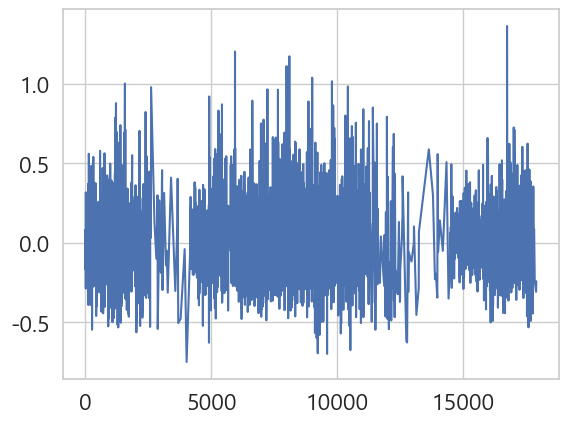

In [93]:
model_iqr.resid.plot(label = "full model")


<Axes: >

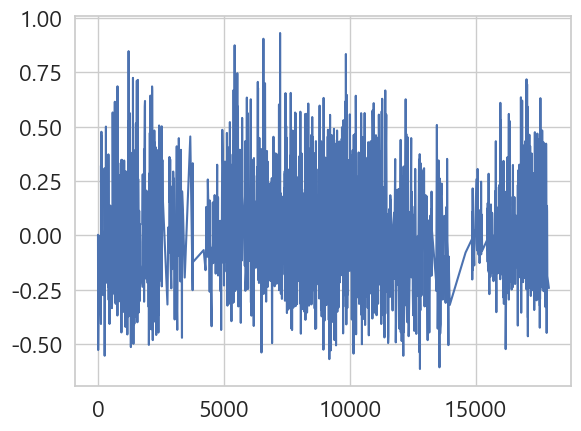

In [94]:
model_10.resid.plot(label = "full model")


<Axes: >

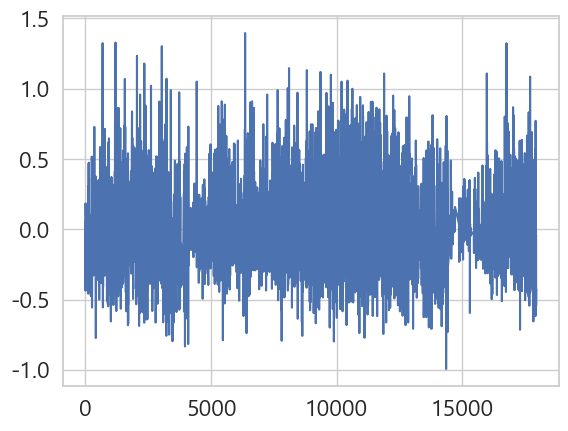

In [95]:
model_5.resid.plot(label = "full model")


<Axes: >

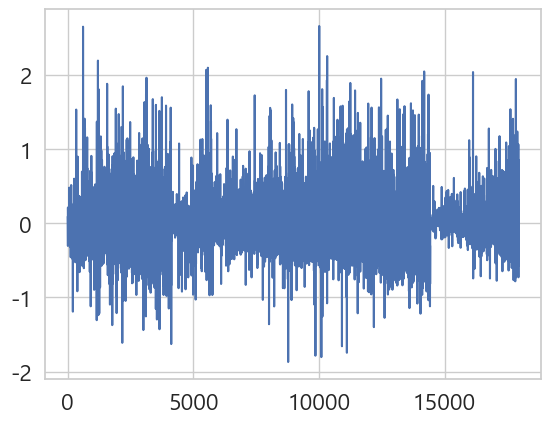

In [96]:
model_1.resid.plot(label = "full model")


In [36]:
import patsy
y, X = patsy.dmatrices('소득 ~ 성별 + 가구원수+ 연령  + 저축 + 부동산 + 담보대출 + 식료지출 + 주거지출 + 세금 + 직업 + 수도권여부 + 학력', data, return_type='matrix')
from statsmodels.stats.outliers_influence import variance_inflation_factor
for i, x in enumerate(X.design_info.column_names):
    print( 'VIF of', x, ':', variance_inflation_factor(X, i))

VIF of Intercept : 105.99296085438655
VIF of 직업[T.2] : 6.696154212920925
VIF of 직업[T.3] : 6.18678159896779
VIF of 직업[T.4] : 4.661691123819283
VIF of 직업[T.5] : 4.462871047009882
VIF of 직업[T.6] : 5.061671625173428
VIF of 직업[T.7] : 5.3196145153239796
VIF of 직업[T.8] : 6.366554656043887
VIF of 직업[T.9] : 7.332200861096171
VIF of 직업[T.A] : 1.0747975758617303
VIF of 직업[T.기타] : 12.91635284930875
VIF of 수도권여부[T.G2] : 1.0915416808134124
VIF of 학력[T.2] : 3.3204525407233656
VIF of 학력[T.3] : 3.2137832121758847
VIF of 학력[T.4] : 6.373380217163268
VIF of 학력[T.5] : 4.037043773046172
VIF of 학력[T.6] : 6.48192710980284
VIF of 학력[T.7] : 2.3108105288314675
VIF of 학력[T.8] : 1.5357104052541004
VIF of 성별 : 1.4181784646541054
VIF of 가구원수 : 1.755145797844178
VIF of 연령 : 2.2730371435103978
VIF of 저축 : 1.2842611547891853
VIF of 부동산 : 1.809620005037279
VIF of 담보대출 : 1.361357681300944
VIF of 식료지출 : 1.9996445362037882
VIF of 주거지출 : 1.1453640625271126
VIF of 세금 : 1.297485110304865
